In [ ]:
from data_util import tfrecord_reading_utils

In [47]:
import os
import json

data_path = "datasets/Continuous"
with open(os.path.join(data_path, "metadata.json")) as f:
    metadata = json.load(f)

In [48]:
print(json.dumps(metadata, indent=4))

{
    "bounds": [
        [
            0.1,
            0.9
        ],
        [
            0.1,
            0.9
        ]
    ],
    "sequence_length": 400,
    "default_connectivity_radius": 0.015,
    "dim": 2,
    "dt": 0.0025,
    "vel_mean": [
        -8.354939525650499e-06,
        -0.0006700268050475755
    ],
    "vel_std": [
        0.0012210637302915602,
        0.0016476477870733647
    ],
    "acc_mean": [
        -7.09329348369307e-08,
        1.097814658415377e-07
    ],
    "acc_std": [
        0.00010648569093437064,
        0.0001564746147958972
    ],
    "context_mean": [
        0.4423277263895835
    ],
    "context_std": [
        0.2564566730199117
    ]
}


In [49]:
import tensorflow as tf
import functools

split = "train"

ds = tf.data.TFRecordDataset(
    [os.path.join(data_path, f"{split}.tfrecord")]
)
ds = ds.map(
    functools.partial(
        tfrecord_reading_utils.parse_serialized_simulation_example,
        metadata=metadata
    )
)

In [50]:
for sample in ds.as_numpy_iterator():
    context, parsed_features = sample
    print(context.keys())
    print(parsed_features.keys())
    break

dict_keys(['particle_type', 'key'])
dict_keys(['position', 'step_context'])


In [58]:
for sample in ds.as_numpy_iterator():
    context, parsed_features = sample
    particle_type = context["particle_type"]
    position = parsed_features["position"]
    step_context = None
    if "step_context" in parsed_features:
        step_context = parsed_features["step_context"]
    break

In [59]:
print(particle_type.shape, particle_type.dtype)
print(position.shape, position.dtype)
print(step_context.shape, step_context.dtype)

(2185,) int64
(401, 2185, 2) float32
(401, 1) float32


In [53]:
import torch

particle_type = torch.from_numpy(particle_type.copy())
position = torch.from_numpy(position.copy())

<Figure size 640x480 with 0 Axes>

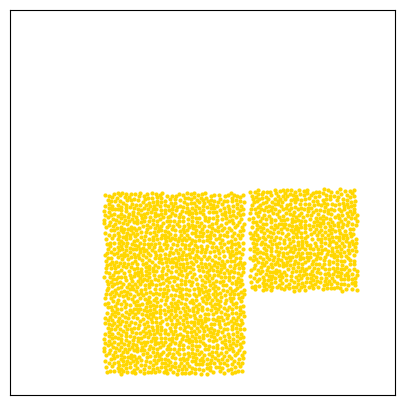

In [54]:
from visualize import visualize_single
from IPython.display import display, HTML
import matplotlib.pyplot as plt

plt.clf()

anim = visualize_single(particle_type, position, metadata)
display(HTML(anim.to_jshtml()))

In [55]:
trajectories = []
for sample in ds.as_numpy_iterator():
    _, parsed_features = sample
    position = parsed_features["position"]
    trajectories.append(position)
len(trajectories)

KeyboardInterrupt: 

In [ ]:
# compute max, min and average number of particles, average number of particles

num_particles = [t.shape[1] for t in trajectories]
max_particles = max(num_particles)
min_particles = min(num_particles)
avg_particles = sum(num_particles) / len(num_particles)

In [ ]:
traj_1 = trajectories[0]

horizontal_bounds = [
    traj_1[:, :, 0].min(),
    traj_1[:, :, 0].max()
]
vertical_bounds = [
    traj_1[:, :, 1].min(),
    traj_1[:, :, 1].max()
]

# print to 2 decimal places
print("Horizontal boundaries:", [f"{x:.1f}" for x in horizontal_bounds])
print("Horizontal boundaries:", [f"{x:.1f}" for x in vertical_bounds])

Horizontal boundaries: ['0.1', '0.9']
Horizontal boundaries: ['0.1', '0.7']


In [ ]:
print(metadata["bounds"][0])
print(metadata["bounds"][1])

[0.1, 0.9]
[0.1, 0.9]


In [ ]:
# velocities as finite differences
velocities = []
for traj in trajectories:
    velocities.append(traj[1:] - traj[:-1])

len(velocities)

KeyboardInterrupt: 

In [ ]:
# element-wise mean velocity
mean_velx = 0
mean_vely = 0
for vel in velocities:
    mean_velx += vel[:, :, 0].mean()
    mean_vely += vel[:, :, 1].mean()
mean_velx /= len(velocities)
mean_vely /= len(velocities)
mean_velx, mean_vely

(9.118336113203896e-06, -0.00025781137958256296)

In [ ]:
metadata["vel_mean"]

[1.1927917091800243e-05, -0.0002563314637168018]

In [ ]:
# std deviation of velocities

std_velx = 0
std_vely = 0

for vel in velocities:
    std_velx += vel[:, :, 0].std()
    std_vely += vel[:, :, 1].std()
std_velx /= len(velocities)
std_vely /= len(velocities)
std_velx, std_vely

(0.0013862969083711504, 0.001266402491775807)

In [ ]:
metadata["vel_std"]

[0.0013973410613251076, 0.00131291713199288]

In [ ]:
# acceleration as finite differences
accelerations = []
for vel in velocities:
    accelerations.append(vel[1:] - vel[:-1])

len(accelerations)

1000

In [ ]:
# element-wise mean acceleration
mean_accelx = 0
mean_accely = 0

for acc in accelerations:
    mean_accelx += acc[:, :, 0].mean()
    mean_accely += acc[:, :, 1].mean()
mean_accelx /= len(accelerations)
mean_accely /= len(accelerations)
mean_accelx, mean_accely

(-6.268461241437651e-09, 8.742138409867373e-08)

In [ ]:
metadata["acc_mean"]

[-1.10709094667326e-08, 8.749365512454699e-08]

In [ ]:
# std deviation of accelerations
std_accelx = 0
std_accely = 0

for acc in accelerations:
    std_accelx += acc[:, :, 0].std()
    std_accely += acc[:, :, 1].std()

std_accelx /= len(accelerations)
std_accely /= len(accelerations)
std_accelx, std_accely

(6.418171428595088e-05, 7.416004085825989e-05)

In [ ]:
metadata["acc_std"]

[6.545267379756913e-05, 7.965494666766224e-05]